### Principles of Superconducting Quantum Computers
Daniel D. Stancil, Gregory T. Byrd, Wiley, 2022  ISBN: [978-1119750727](https://bcs.wiley.com/he-bcs/Books?action=index&bcsId=12203&itemId=1119750725)


## Chapter 1: Qubits, Gates, and Circuits
## Single-qubit gates

A quantum gate is a transformation from one quantum state to another. A classical logic gates is physical circuit -- if you apply a voltage to the input of the gate, then an output voltage appears on the other side of the circuit. In contrast, a quantum gate is an *action* that is applied to a qubit that changes its state. The input and output correspond to the starting and ending states, respectively.

In this notebook, we will discuss gates that operate on a single qubit state.

In [25]:
pip install kaleidoscope

Note: you may need to restart the kernel to use updated packages.


In [26]:
import numpy as np
import matplotlib.pyplot as plt
from qiskit import QuantumCircuit, execute
from qiskit.quantum_info import Statevector, Operator
from qiskit.visualization import array_to_latex, plot_histogram
from qiskit import Aer
import kaleidoscope.qiskit
from kaleidoscope import bloch_disc, bloch_sphere

As you know, a single qubit state is described as a two-dimensional *state vector*. An operator that transforms a vector to another vector is a *matrix*, so a quantum gate (operator) operating on one qubit is described mathematically as a $2\times 2$ matrix. The simplest gate is one that does nothing -- this is the identity matrix, $I$.

$$ I |\psi \rangle = \begin{bmatrix} 1 & 0 \\ 0 & 1 \end{bmatrix}\begin{bmatrix} \alpha \\ \beta \end{bmatrix} = \begin{bmatrix} \alpha \\ \beta \end{bmatrix} $$

If you are rusty on the rules of matrix-vector multiplication, this would be a good time to [review](https://mathinsight.org/matrix_vector_multiplication)!

# X Gate: Quantum NOT

Our first quantum gate that actually does something will be the $X$ gate. Analogous to a classical NOT gate, the $X$ transforms $|0\rangle$ to $|1\rangle$, and $|1\rangle$ to $|0\rangle$. The picture below shows a quantum $X$ gate on the left and a classical NOT gate on the right.

<img src="Principles Superconducting QC /Single Qubit Gates/gates_1q_x.png" width="450">

The matrix for the $X$ is shown below, followed by Python code that demonstrates that the correct transformations are performed on the $|0\rangle$ and $|1\rangle$ states.  The `matrix` class from `numpy` is used for the $X$ gate.

$$ X = \begin{bmatrix} 0 & 1 \\ 1 & 0 \end{bmatrix} $$

In [27]:
zero = Statevector([1,0])
one = Statevector([0,1])
xgate = Operator([[0,1],[1,0]])  # specify X operator as a matrix

In [28]:
a = zero.evolve(xgate) # apply the X operator to the |0> state vector
array_to_latex(a)

<IPython.core.display.Latex object>

Reminder: The `array_to_latex` function shows a row vector, but the state vector is normally considered a column vector.

In [29]:
b = one.evolve(xgate)  # apply the X operator to the |1> state vector
array_to_latex(b)

<IPython.core.display.Latex object>

On a general state vector, the effect of the $X$ gate is to exchange the amplitudes of the basis states.

$$ X |\psi\rangle = \begin{bmatrix} 0 & 1 \\ 1 & 0 \end{bmatrix} \begin{bmatrix} \alpha \\ \beta \end{bmatrix} = \begin{bmatrix} \beta \\ \alpha \end{bmatrix} $$

In [30]:
psi = Statevector([0.5, (1j)*np.sqrt(3)/2])
array_to_latex(psi)

<IPython.core.display.Latex object>

In [31]:
array_to_latex(psi.evolve(xgate))

<IPython.core.display.Latex object>

#### Z Gate: Phase Flip

Another fundamental single-qubit operator is the $Z$ gate. It adds a *local phase* of $\pi$ (180 degrees) to the quantum state. This means that is changes the sign of the $|1\rangle$ basis state and leaves the $|0\rangle$ state unchanged.

$$ Z = \begin{bmatrix}1 & 0 \\ 0 & -1 \end{bmatrix}$$

In [32]:
zgate = Operator([[1,0],[0,-1]])

In [33]:
array_to_latex(zero.evolve(zgate))

<IPython.core.display.Latex object>

In [34]:
array_to_latex(one.evolve(zgate))

<IPython.core.display.Latex object>

In [35]:
array_to_latex(psi.evolve(zgate))

<IPython.core.display.Latex object>

#### Y Gate: Combination of X and Z

The $Y$ gate is equivalent to performing a $X$ followed by an $Z$, and an additional *global phase* of $-\pi/2$.  ("Global" means that the phase is applied to both the $|1\rangle$ and $|0\rangle$ basis states.) Notice that matrix multiplication is not commutative, so when we say "$Z$ then $Z$," the matrices go from right to left:

$$ Y = -iZX = \begin{bmatrix}0 & -i \\ i & 0 \end{bmatrix} $$

In [36]:
ygate = Operator([[0,-1j],[1j,0]])

In [37]:
array_to_latex(zero.evolve(ygate))

<IPython.core.display.Latex object>

In [38]:
array_to_latex(one.evolve(ygate))

<IPython.core.display.Latex object>

In [39]:
array_to_latex(psi.evolve(ygate))

<IPython.core.display.Latex object>

#### Pauli Gates: X, Y, Z
The three single-qubit gates presented so far as known as the *Pauli gates*, named after [Wolfgang Pauli](https://en.wikipedia.org/wiki/Wolfgang_Pauli), an Austrian theoretical physicist who was one of the pioneers of quantum mechanics.

These gates can be considered *rotation operators* around the three axes of the Bloch sphere.
- $X$ = clockwise rotation of $\pi$ (180 degrees) around the $x$ axis
- $Z$ = clockwise rotation of $\pi$ (180 degrees) around the $z$ axis
- $Y$ = clockwise rotation of $\pi$ (180 degrees) around the $y$ axis

Let's see the effect of these operators on the $|\psi\rangle$ state defined above.

In [40]:
bloch_sphere(psi)

In [41]:
bloch_sphere(psi.evolve(xgate))

In [42]:
bloch_sphere(psi.evolve(zgate))

In [43]:
bloch_sphere(psi.evolve(ygate))

#### Hadamard Gate: Superposition
Another interesting single-qubit operator is known as the *Hadamard gate*. This one is named after a French mathematician, [Jacques Hadamard](https://en.wikipedia.org/wiki/Jacques_Hadamard) -- not because of a contribution to quantum physics, but based on the relationship to the [Hadamard transform](https://en.wikipedia.org/wiki/Hadamard_transform).

This gate is one that creates a *superposition* from the computational basis states. It can be viewed as a rotation around the $X = Z$ axis in the Bloch sphere.

$$ H = \frac{1}{\sqrt{2}}\begin{bmatrix}1 & 1\\1 & -1\end{bmatrix} $$

Consider the action of the Hadamard operator on the $|0\rangle$ and $|1\rangle$ states:

In [44]:
hgate = Operator([[1/np.sqrt(2), 1/np.sqrt(2)], [1/np.sqrt(2), -1/np.sqrt(2)]])

In [45]:
plus = zero.evolve(hgate)
array_to_latex(plus)

<IPython.core.display.Latex object>

In [46]:
minus = one.evolve(hgate)
array_to_latex(minus)

<IPython.core.display.Latex object>

You may recognize these as the plus $|+\rangle$ and minus $|-\rangle$ states.
$$ H|0\rangle = |+\rangle = \frac{|0\rangle + |1\rangle}{\sqrt{2}}$$
$$ H|1\rangle = |-\rangle = \frac{|0\rangle - |1\rangle}{\sqrt{2}}$$

In [47]:
bloch_sphere(plus)

In [48]:
bloch_sphere(minus)

#### Unitary Operators
Every unitary operator is represented by a *unitary* matrix. This is a matrix that does not change the length of the vector being operated on. Every unitary matrix has an inverse, which means that the operation is *reversible*: we can apply the inverse operator to recover the initial state. It is also true that the matrix's inverse is its conjugate transpose.  In other words, for any unitary matrix $U$,

$$ UU^{-1} = UU^{\dagger} = I $$

For all of the gates we've considered so far, the matrix is its own inverse. Applying the gate twice in a row will result in the original state.

$$ X = X^{-1}, Y = Y^{-1}, Z = Z^{-1}, H = H^{-1} $$

Measurement is not unitary, because it cannot be reversed. Once a measurement is performed, the superposition is destroyed and the qubit is forced into one of the basis states -- the state before the measurement cannot be recovered.

#### Circuits and Measurement
One way to express a quantum computation is through a *quantum circuit*. A general computation can be described by tracing the state of a collection of qubits, applying single- and multi-qubit gates, and typically ending with a *measurement*. A measurement (in the computational basis) returns a classical 0 or 1 for each qubit, and forces the measured qubits into a basis state ($|0\rangle$ or $|1\rangle$). Because the outcome is usually probabilistic, a quantum circuit is generally executed many times to collect and analyze a sample of outputs.

Consider the example circuit below:

<img src="gates_1q_circuit.png" width="350">

The horizontal line tracks the state of a single qubit through time, from left to right. By convention, the qubit is usually initialized to $|0\rangle$. We operate on the qubit with a sequence of gates: in this case, $H$ then $Y$. The circuit ends with a measurement. (The double-line coming out of the measurement indicates that the qubit is now in a "classical" state, corresponding to the measured value.)

NOTE: The mathematical formula for this circuit (without measurement) is $YH|0\rangle$; remember that matrix multiplication is applied in the reverse order of the gates in the circuit.

Using Qiskit, we can model the behavior of this circuit in three ways.

(1) We can "do the math" and evolve the initial state vector, as shown above. 

In [49]:
s1 = zero.evolve(hgate)
s2 = s1.evolve(ygate)
array_to_latex(s2)

<IPython.core.display.Latex object>

The `probabilities` method of Statevector shows the probability of measuring each basis state. In this case, we find a 50% chance of measuring 0, and a 50% chance of measuring 1.

In [50]:
s2.probabilities()

array([0.5, 0.5])

(2) We can create a quantum circuit containing the gates, and we can let Qiskit generate the state vector resulting from applying the gates to an initial state of zero. We leave off the measurement in order to see the full state vector, just as we did in (1).

In [51]:
qc = QuantumCircuit(1)  # create a quantum circuit with one qubit
qc.h(0)   # add H gate to qubit 0
qc.y(0)   # add Y gate to qubit 0
sv = Statevector(qc)   # generate state vector from the circuit
array_to_latex(sv)

<IPython.core.display.Latex object>

In [52]:
sv.probabilities()

array([0.5, 0.5])

(3) This time, we'll create the circuit and simulate its execution on an ideal quantum computer. To perform the measurement, we need to include a classical bit as part of the circuit: when we measure qubit 0, the result will be stored in the classical bit.

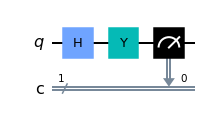

In [53]:
qc = QuantumCircuit(1, 1)  # create circuit with one qubit and one classical bit
qc.h(0)  # add H gate to qubit 0
qc.y(0)  # add Y gate to qubit 0
qc.measure(0,0)  # measure qubit 0 to classical bit 0
qc.draw('mpl')   # draw the circuit

Next, we instantiate a simulator and execute the circuit. We run the circuit 1000 times and collect the number of occurrences for each result. Each run is called a "shot."

In [54]:
qsim = Aer.get_backend('qasm_simulator')
job = execute(qc, qsim, shots=1000)  
result = job.result()
print(result.get_counts())

{'0': 481, '1': 519}


Qiskit also provides way to visualize the counts as a histogram. As expected, we see roughly 50% 0's and 50% 1's. It's not exact, because each outcome is probabilistic.

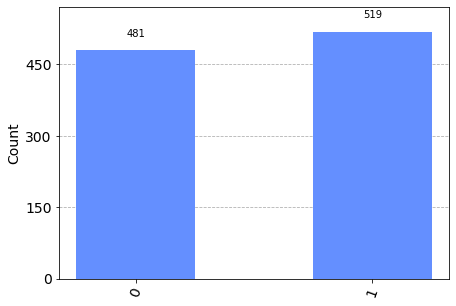

In [55]:
plot_histogram(result.get_counts())

#### Exercises
In the cells below, model the behavior of a circuit that performs $YZH|0\rangle$, using the three methods shown above.

(1) Evolve the initial state vector using gate operators.

In [57]:
s1 = zero.evolve(hgate)
s2 = s1.evolve(zgate)
s3 = s2.evolve(ygate)
array_to_latex(s3)

<IPython.core.display.Latex object>

In [58]:
s3.probabilities()

array([0.5, 0.5])

In [59]:
qc = QuantumCircuit(1)  # create circuit with one qubit and one classical bit
qc.h(0) #add H gate to Qubit 0
qc.z(0) # add Z gate to Qubit 0
qc.y(0)  # add Y gate to qubit 0
sv = Statevector(qc)   # generate state vector from the circuit
array_to_latex(sv)


<IPython.core.display.Latex object>

In [60]:
sv.probabilities()

array([0.5, 0.5])

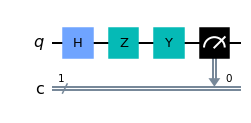

In [61]:
qc = QuantumCircuit(1, 1)  # create circuit with one qubit and one classical bit
qc.h(0)  # add H gate to qubit 0
qc.z(0)  # add Z gate to qubit 0
qc.y(0)  # add Y gate to qubit 0
qc.measure(0,0)  # measure qubit 0 to classical bit 0
qc.draw('mpl')   # draw the circuit

In [62]:
qsim = Aer.get_backend('qasm_simulator')
job = execute(qc, qsim, shots=1000)  
result = job.result()
print(result.get_counts())

{'1': 511, '0': 489}


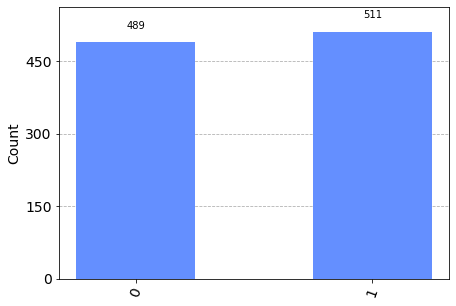

In [63]:
plot_histogram(result.get_counts())

In [64]:
import qiskit.tools.jupyter
%qiskit_version_table